<a href="https://colab.research.google.com/github/xihajun/footwear-project/blob/master/code/footwear_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Colab Setup

In [0]:
!pip install labelme
!pip install keract

In [2]:
import numpy as np
import pandas as pd

import os
import subprocess

import xml.etree.ElementTree as ElementTree
import numpy as np
import pandas as pd
from scipy.sparse import csr_matrix, hstack, vstack

import tensorflow as tf
from keras import Sequential
from keras.layers import Conv2D, MaxPooling2D, Activation, UpSampling2D, Cropping2D, Flatten, Dense, Dropout, BatchNormalization

from keras.layers.normalization import BatchNormalization

from skimage import transform, data, io, filters, measure 
import pickle

import matplotlib.pyplot as plt

import keract

Using TensorFlow backend.


## Import Google Drive

In [3]:
from google.colab import drive
drive.mount('/content/drive')

import os
os.chdir("./drive/My Drive/")
os.chdir("./footwear")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
ls

build/          footwear/          __MACOSX/        ruler_footwear_marker/
croped/         footwear_area/     model.pl         ruler_model.pl
cropped/        get-data-files.sh  old.pl           setup.py
data/           id.pl              PCV/             small_img/
data.pl         images/            pcv_book/        small_img.pl
examples/       label/             README.md        temp/
examples2/      labels/            ruler/           test/
expand_tabs.py  LICENSE.txt        ruler_footwear/  type.pl


## Load files and images

In [0]:
imglist = []
for dirname, _, filenames in os.walk('./images'):
    for filename in filenames:
        imglist.append(os.path.join(dirname,filename))
    break

# remove README.txt
imglist = imglist[1:]

In [0]:
def ori_small_img(testingset):
  '''
  load img and resize it
  Args:
    testingset: filename
  Returns:
    img: original image
    transform.resize(img, (376,504)): resized image
  '''
  # load the training img
  img = plt.imread(testingset)
  (width,height,depth) = img.shape
  img = np.array(img.reshape((width,height,depth)))# / 255
  
  return img, transform.resize(img, (376,504))

In [0]:
# create a table to save the info
data = pd.DataFrame()
data['filename'] = imglist

--------------------------

### Option1: ignore it on second running

Take quite a while to return a list with original and resized images

In [0]:
all_images = list(map(ori_small_img,imglist))

In [0]:
with open("all_img.pl",'wb') as f:
  pickle.dump(all_images,f)

--------------

### Option2: run this if `all_img.pl` exists

In [0]:
with open("all_img.pl",'rb') as f:
  all_images = pickle.load(f)

--------------

In [0]:
ori = [image[0] for image in all_images]
images = [image[1] for image in all_images]

In [0]:
data['original_img'] = ori
data['small_img'] = images

# Neural Networks

## function clarification

In [0]:
def plot(array):
  plt.figure
  plt.imshow(array)

# plot(ruler_labels[0])

## data preparation 

This requires a tool named: `labelme` which could be found [here](https://github.com/wkentaro/labelme).

The labelling process is to mark the footwears and ruler marks by using this tool, and it would generate a json file automatically. By using `labelme_json_to_dataset`, we are able to generate the labeled images with two different colors (red and green in our example).

In [0]:
labellist = []
for dirname, _, filenames in os.walk('./label'):
    for filename in filenames:
        labellist.append(os.path.join(dirname,filename))
    break

In [0]:
# labels: for neural networks training process
# marker_labels: get the marker area
labels = []
ruler_trainingsets = []
marker_labels = []
for i in range(len(labellist)):
    subprocess.run(["labelme_json_to_dataset", labellist[i],"-o","./tmp"])
    label = plt.imread("./tmp/label.png")
    # To get a binary matrix
    label[:,:,0] = label[:,:,0]!=0
    label[:,:,1] = label[:,:,1]!=0
    labels.append(label)
    marker_labels.append(label[:,:,1])
    x = plt.imread("./tmp/img.png")
    x = np.delete(x, 3, axis = 2)
    ruler_trainingsets.append(x)

## define the model

In [18]:
(width,height,depth) = (376,504,3)

ruler_model = Sequential()

ruler_model.add(Conv2D(32,kernel_size = (2,2), 
                input_shape = (width,height,depth), 
                activation = 'relu',
                padding = 'same'))
ruler_model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))

ruler_model.add(Conv2D(32,
                kernel_size = (2,2), 
                activation = 'relu',
                padding = 'same'))
ruler_model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))

ruler_model.add(Conv2D(3,
                kernel_size = (2,2), 
                activation = 'sigmoid',
                padding = 'same'))
ruler_model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))

ruler_model.add(UpSampling2D(size=(2, 2),
    data_format=None,
    interpolation='nearest'))

ruler_model.add(UpSampling2D(size=(2, 2),
    data_format=None,
    interpolation='nearest'))

ruler_model.add(UpSampling2D(size=(2, 2),
    data_format=None,
    interpolation='nearest'))

# ruler_model.add(Activation(activation='sigmoid'))
ruler_model.compile(optimizer='adam', loss='binary_crossentropy')

Instructions for updating:
If using Keras pass *_constraint arguments to layers.



## Train the model

In [53]:
ruler_model.fit(np.array(ruler_trainingsets),np.array(ruler_labels).reshape(6,376,504,3),epochs=600, verbose = 0)

## prediction

In [0]:
predictions = ruler_model.predict(np.array(images))
predictions_bw_img = [prediction[:,:,1].reshape(width,height) for prediction in predictions]
predictions_footwear_img = [prediction[:,:,0].reshape(width,height) for prediction in predictions]

# save into data
data['prediction'] = list(predictions)
data['predictions_ruler_marker'] = predictions_bw_img
data['predictions_footwear_img'] = predictions_footwear_img

# footwear image processing

## function defination

In [0]:
def method_to_find_peak(a):
  sum_bag = [a[0]]
  k = 1
  for i in range(len(a)-1):
    if a[i+1] != a[i] and a[i+1] == 1:
      k=-1*k
      sum_bag.append(sum_bag[i]+k*a[i])
    else:
      sum_bag.append(sum_bag[i]+k*a[i])
  return sum_bag

In [0]:
def largeConnectComponent(bw_img):
    labeled_img, num = measure.label(bw_img, neighbors=8, background=0, return_num=True)
    max_label = []
    max_num = 0
    # import pdb; pdb.set_trace()
    for i in range(1, num+1):
        if np.sum(labeled_img == i) > 4000:
            max_num = np.sum(labeled_img == i)
            max_label.append(i)
    mcr = [(labeled_img == large_label) for large_label in max_label]
    if len(mcr) == 1:
      return np.array(mcr).reshape(376,504)
    else:
      return sum(mcr)

In [0]:
def largeConnectComponent_weak(bw_img):
    labeled_img, num = measure.label(bw_img, neighbors=8, background=0, return_num=True)
    max_label = []
    max_num = 0
    # import pdb; pdb.set_trace()
    for i in range(1, num+1):
        if np.sum(labeled_img == i) > 100:
            max_num = np.sum(labeled_img == i)
            max_label.append(i)
    mcr = [(labeled_img == large_label) for large_label in max_label]
    if len(mcr) == 1:
      return np.array(mcr).reshape(376,504)
    else:
      return sum(mcr)

In [0]:
def find_crop_loc(matrix):
    # matrix is the prediction as above
    # task: find the left point, right point, up point and down point
    d,r = matrix.shape
    u = 0
    for i in matrix:
        u+=1
        if sum(i)!=0:
            break
    for i in reversed(matrix):
        d-=1
        if sum(i)!=0:
            break 
    return u,d

In [0]:
def return_big_box(filtered_array):
  up,down = find_crop_loc(filtered_array)
  left,right = find_crop_loc(filtered_array.T)
  return (8*left,8*up,8*right,8*down)

## area selection

### Analysis 1

To select the area we have to analyse the output of neural network:
![sample](https://github.com/xihajun/Keep-learning/raw/master/data/footwear/sample.png)

As we can see above, the ruler markers usually exist at the botton or the top of the pictures. If we scan by rows, the marker area should have the highest value. By doing so, we are able to select those rows.
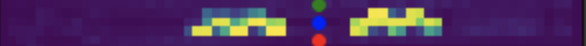


### Analysis 2

By selecting the marker rows, we can sum them by rows. After that, the marker area should have two peaks in this 1 deminsion data. 

### code

In [35]:
selected_areas = list(map(largeConnectComponent,np.rint(predictions_footwear_img)))
might_wrong = []
maker_length_all = []
for i in range(len(predictions_bw_img)):

  # find the 
  find_loc = sum(predictions_bw_img[i].T)
  locations = np.where(find_loc >= max(find_loc))
  # col_start to col_end should be the marker 
  col_start = min(locations[0]) - 6
  col_end = max(locations[0]) + 6
  selected_marker_row = sum(predictions_bw_img[i][col_start:col_end])
  mean = np.mean(selected_marker_row)
  two_marker_loc = np.where(selected_marker_row>=mean)[0]
  # 两个连续的数列
  marker = range(min(two_marker_loc),max(two_marker_loc)+1)
  med = list(set(marker)-set(two_marker_loc))

  # check the marker detection correctness
  if len(med) == len(list(range(min(med),max(med)+1))):
    print("yes this should be the marker")
    maker_center = np.median(med)
    maker_length = max(two_marker_loc) - min(two_marker_loc)
    maker_width = maker_length/14
    might_wrong.append(0)
  else:
    print("something wrong, trying to fix it")
    selected_marker_row[selected_marker_row>np.mean(selected_marker_row)]=1
    selected_marker_row[selected_marker_row!=1] = 0
    sum_bag = method_to_find_peak(list(selected_marker_row))
    center_pixels = np.where(np.abs(sum_bag) == max(np.abs(sum_bag)))[0]
    maker_center = np.median(center_pixels)
    maker_length = len(center_pixels)*4
    maker_width = maker_length/14
    might_wrong.append(1)

  maker_length_all.append(maker_length)

  if np.median(locations[0])>376/2:
    selected_areas[i][int(np.median(locations[0])-maker_width):,:] = 0
    try:
      selected_areas[i][:,:int(maker_center-maker_length/140*150+maker_width)] = 0
    except:
      print(maker_center-maker_length/140*150+maker_width,np.median(locations[0])-maker_width-maker_length/140*85)
  else:
    selected_areas[i][:int(np.median(locations[0])+maker_width),:] = 0
    try:
      selected_areas[i][:,int(maker_center+maker_length/140*150-maker_width):] = 0
    except:
      print(maker_center+maker_length/140*150-maker_width,np.median(locations[0])+maker_width+maker_length/140*85)

data['might_wrong'] = might_wrong
data['marker_length'] = maker_length_all

yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
something wrong, trying to fix it
yes this should be the marker
yes this should be the marker
something wrong, trying to fix it
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
yes this should be the marker
ye

In [0]:
selected_areas_k = list(map(largeConnectComponent,selected_areas))

In [0]:
locations = list(map(return_big_box,selected_areas_k))

In [0]:
lengths = [location[2] - location[0] for location in locations]
widths = [location[3] - location[1] for location in locations]
data['length'] = lengths
data['width'] = widths
data['length_cm'] = 14/np.array(data['marker_length'])*np.array(data['length'])/8
data['width_cm'] = 14/np.array(data['marker_length'])*np.array(data['width'])/8
data['age'] = [int(data['filename'][i].split('/')[2].split('-')[4][1:]) for i in range(len(data))]
data['type'] = [data['filename'][i].split('/')[2].split('-')[3] for i in range(len(data))]
data['old'] = [int(data['filename'][i].split('/')[2].split('-')[4][1:])>10 for i in range(len(data))]

## Cropping

### save cropped img to data

In [0]:
from PIL import Image

i = 0
cropped = []
for box in locations:
  img = Image.fromarray(ori[i])
  region = np.array(img.crop(box))
  cropped.append(region)
  i+=1

In [0]:
data['cropped'] = cropped

In [0]:
!rm data.pl

In [0]:
with open('data.pl','wb+') as f:
  pickle.dump(data,f)

### plot it

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


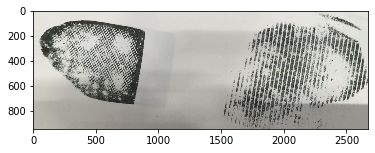

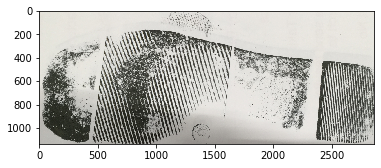

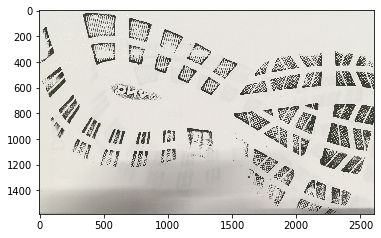

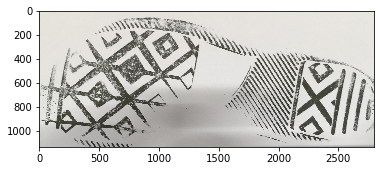

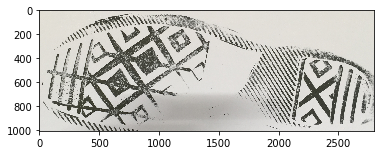

...

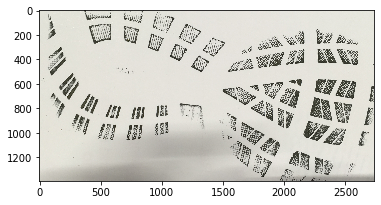

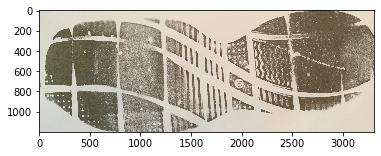

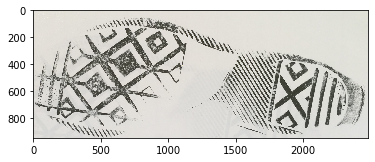

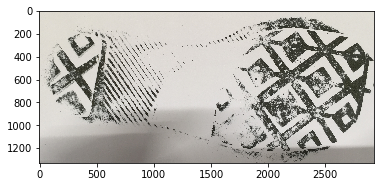

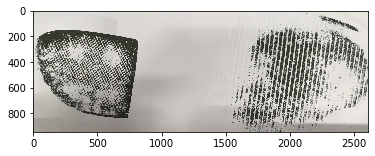

In [48]:
from PIL import Image

i = 0
for box in locations:
  img = Image.fromarray(ori[i])
  region = img.crop(box)
  plt.figure()
  plt.imshow(region)
  i+=1

### save images for temp use

In [0]:
from PIL import Image

i = 0
for box in locations:
  img = Image.fromarray(ori[i])
  region = img.crop(box)
  tempname = './tmp/cropped_'+str(i)+'.png'
  region.save(tempname)
  # plt.figure()
  # plt.imshow(plt.imread(tempname))
  i+=1

## increase image contrastion

The file name could be smarter

In [0]:
from PIL import Image
from PIL import ImageEnhance

j = 0
for i in locations:
  img = Image.open('./tmp/cropped_'+str(j)+'.png')
  enh_con = ImageEnhance.Contrast(img)  
  contrast = 3
  img_contrasted = enh_con.enhance(contrast)  
  img_contrasted.show()
  img_contrasted.save('./new/'+str(j)+'.png')
  j+=1

# Presentation

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


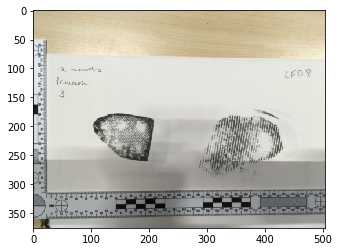

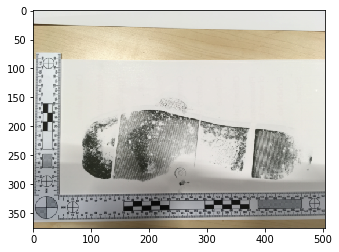

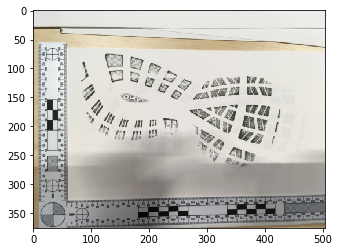

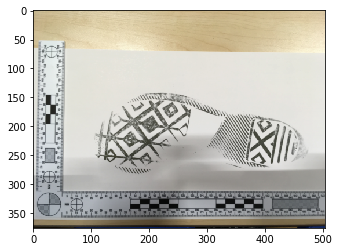

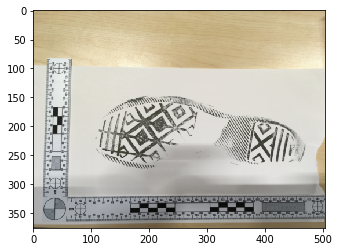

...

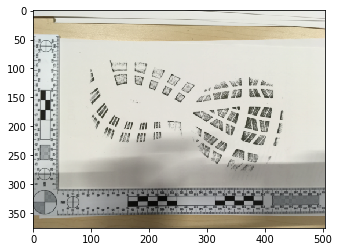

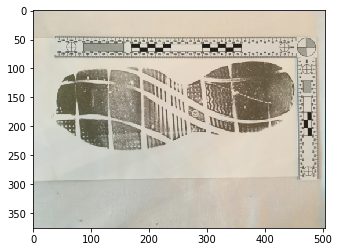

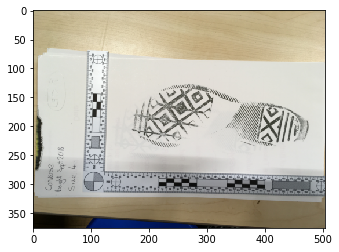

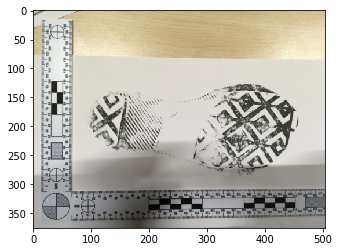

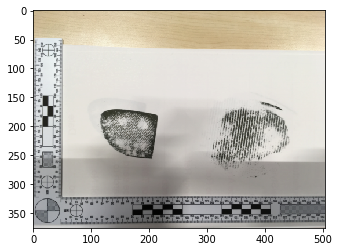

In [0]:
for i in images:
  plt.figure()
  plt.imshow(i)


### footwear selection (autoencoder)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


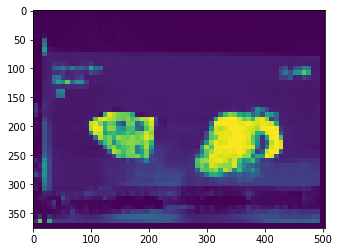

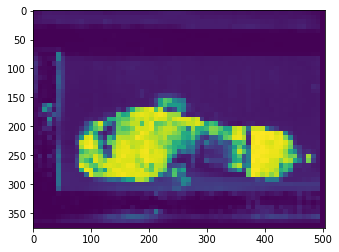

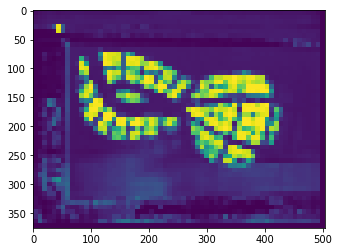

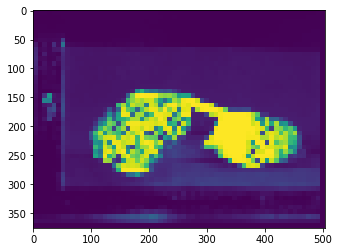

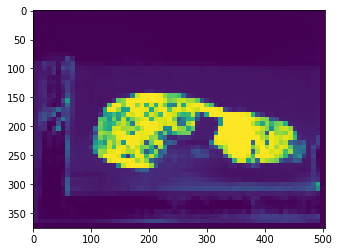

...

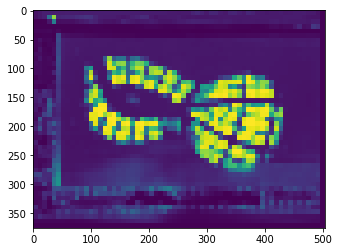

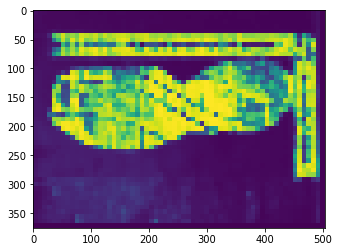

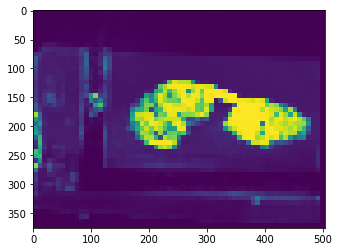

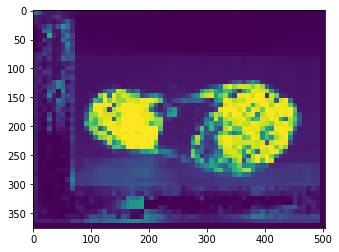

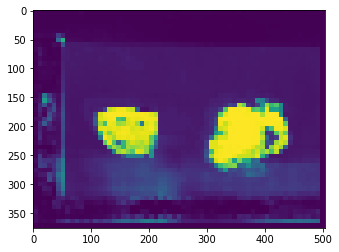

In [0]:
for i in predictions_footwear_img:
  plt.figure()
  plt.imshow(i)

### selected area

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


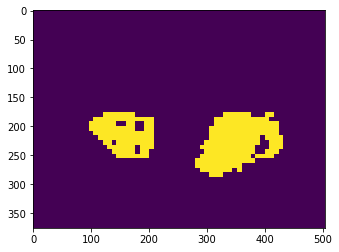

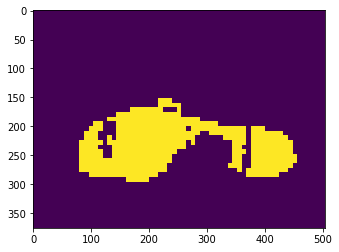

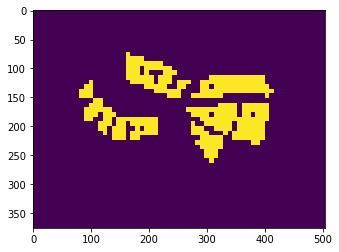

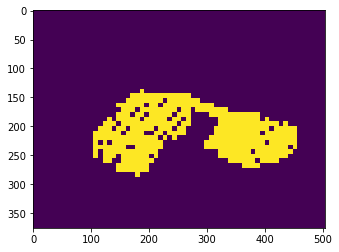

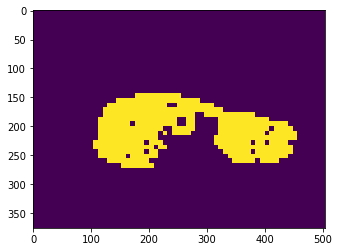

...

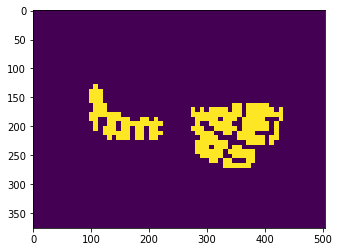

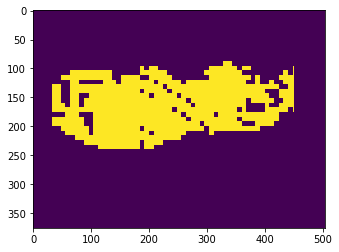

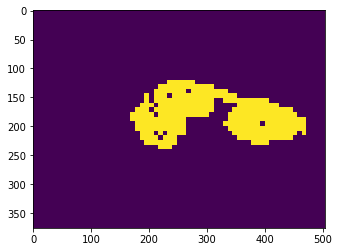

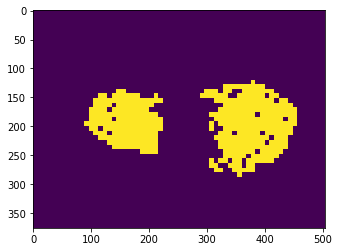

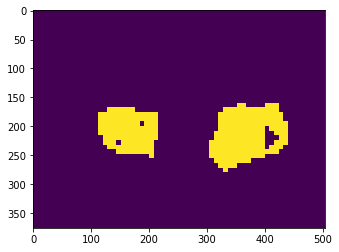

In [0]:
for i in range(len(predictions_footwear_img)):
  plt.figure()
  plt.imshow(selected_areas_k[i])

### ruler selection

yes this should be the marker
331.5 259.5
yes this should be the marker
339.5 263.5
yes this should be the marker
347.5 295.5
yes this should be the marker
339.5 279.5
yes this should be the marker
339.5 271.5
yes this should be the marker
75.5 255.5
yes this should be the marker
347.5 275.5
yes this should be the marker
339.5 259.5
yes this should be the marker
339.5 299.5
yes this should be the marker
339.5 275.5
yes this should be the marker
347.5 283.5
yes this should be the marker
75.5 259.5
yes this should be the marker
331.5 259.5
yes this should be the marker
331.5 263.5
yes this should be the marker
347.5 303.5
yes this should be the marker
331.5 275.5
yes this should be the marker
339.5 279.5
yes this should be the marker
331.5 267.5
yes this should be the marker
339.5 283.5
yes this should be the marker
75.5 267.5
yes this should be the marker
339.5 259.5
yes this should be the marker
339.5 303.5
something wrong, trying to fix it
[296 297 298 299 300 301 302 303 304 305 306 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:40: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


yes this should be the marker
347.5 291.5
yes this should be the marker
331.5 283.5
something wrong, trying to fix it
[240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257
 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275
 276 277 278 279 280 281 282 283 284 285 286 287 288]
75.5 264.0
yes this should be the marker
347.5 283.5
yes this should be the marker
331.5 303.5
yes this should be the marker
83.5 267.5
yes this should be the marker
323.5 275.5
yes this should be the marker
331.5 279.5
yes this should be the marker
59.5 259.5
yes this should be the marker
299.5 303.5
yes this should be the marker
331.5 323.5
yes this should be the marker
347.5 287.5


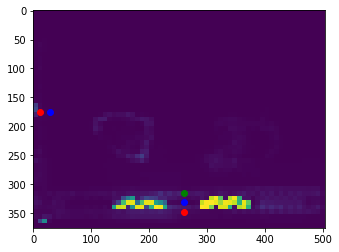

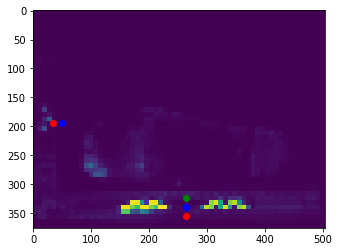

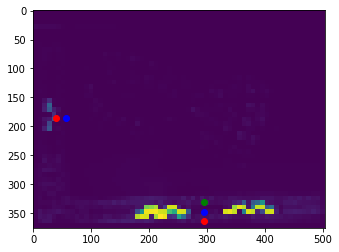

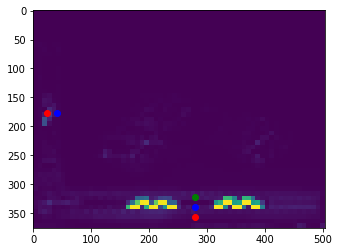

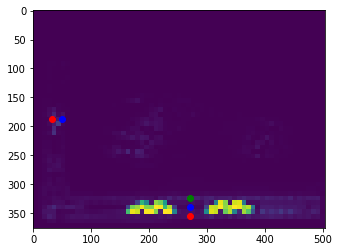

...

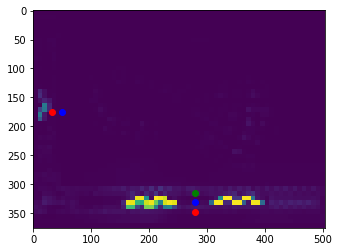

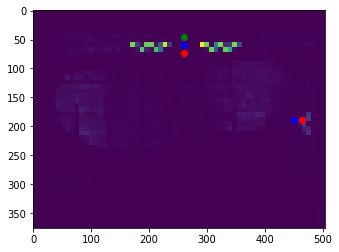

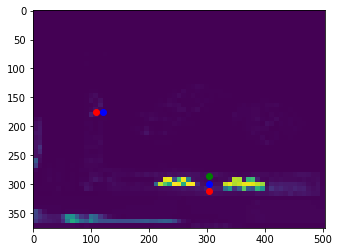

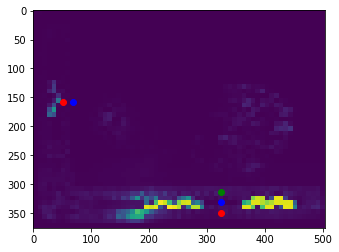

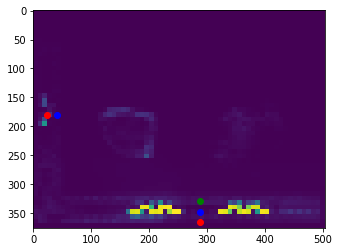

In [0]:
# fixed version
for i in range(0,len(predictions_bw_img)):
  find_loc = sum(predictions_bw_img[i].T)
  locations = np.where(find_loc >= max(find_loc))
  # col_start to col_end should be the marker 
  col_start = min(locations[0]) - 5
  col_end = max(locations[0]) + 5
  selected_marker_row = sum(predictions_bw_img[i][col_start:col_end])
  mean = np.mean(selected_marker_row)
  two_marker_loc = np.where(selected_marker_row>=mean)[0]
  # 两个连续的数列
  marker = range(min(two_marker_loc),max(two_marker_loc)+1)
  med = list(set(marker)-set(two_marker_loc))
  if len(med) == len(list(range(min(med),max(med)+1))):
    print("yes this should be the marker")
    maker_center = np.median(med)
    maker_length = max(two_marker_loc) - min(two_marker_loc)
    maker_width = maker_length/14
  # plt.plot(sum(predictions_bw_img[i][col_start:col_end]))
    print(np.median(locations),maker_center)
    plt.figure()
    plt.imshow(predictions_bw_img[i])
    plt.plot(maker_center,np.median(locations[0]),'bo')
    plt.plot(maker_center,np.median(locations[0])+maker_width,'ro')
    plt.plot(maker_center,np.median(locations[0])-maker_width,'go')
  else:
    print("something wrong, trying to fix it")
    selected_marker_row[selected_marker_row>np.mean(selected_marker_row)]=1
    selected_marker_row[selected_marker_row!=1] = 0
    sum_bag = method_to_find_peak(list(selected_marker_row))
    center_pixels = np.where(np.abs(sum_bag) == max(np.abs(sum_bag)))[0]
    print(center_pixels)
    maker_center = np.median(center_pixels)
    maker_length = len(center_pixels)*4
    maker_width = maker_length/14

    print(np.median(locations),maker_center)
    plt.figure()
    plt.imshow(predictions_bw_img[i])
    plt.plot(maker_center,np.median(locations[0]),'bo')
    plt.plot(maker_center,np.median(locations[0])+maker_width,'ro')
    plt.plot(maker_center,np.median(locations[0])-maker_width,'go')
  if np.median(locations[0])>376/2:
    # 在下就在左边
    try:
      plt.plot(maker_center-maker_length/140*150,np.median(locations[0])-maker_width-maker_length/140*85,'ro')
      plt.plot(maker_center-maker_length/140*150+maker_width,np.median(locations[0])-maker_width-maker_length/140*85,'bo')
    except:
      print(maker_center-maker_length/140*150+maker_width,np.median(locations[0])-maker_width-maker_length/140*85)
  else:
    # 在上就在右边
    try:
      plt.plot(maker_center+maker_length/140*150,np.median(locations[0])+maker_width+maker_length/140*85,'ro')
      plt.plot(maker_center+maker_length/140*150-maker_width,np.median(locations[0])+maker_width+maker_length/140*85,'bo')
    except:
      print(maker_center+maker_length/140*150-maker_width,np.median(locations[0])+maker_width+maker_length/140*85)


# Future work

## model2

In [0]:
def ori_small_img(img):
  # load the training img
  # (width,height,depth) = img.shape
  # img = np.array(img.reshape((width,height,depth)))# / 255
  
  return transform.resize(img, (550,1670))

In [0]:
data['train'] = list(map(ori_small_img, list(data['cropped'])))

In [0]:
data_id = data.loc[data['type'] == 'Converse']

In [0]:
data_id['id'] = data_id.age == 7

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [0]:
def flip180(arr):
    new_arr = arr.reshape(arr.size)
    new_arr = new_arr[::-1]
    new_arr = new_arr.reshape(arr.shape)
    return new_arr

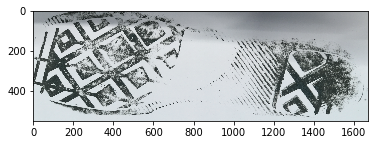

In [0]:
plt.imshow(flip180(data_id['train'].iloc[2]))

In [0]:
data_id['id']

3      True
4      True
8     False
12     True
13    False
15     True
18     True
22    False
23    False
28    False
33     True
34    False
Name: id, dtype: bool

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


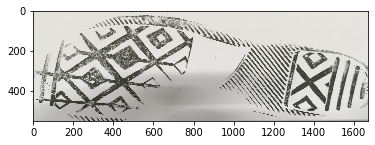

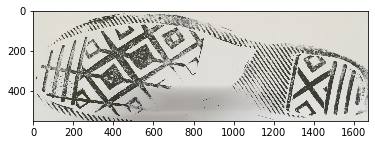

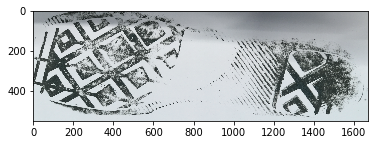

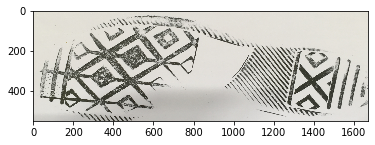

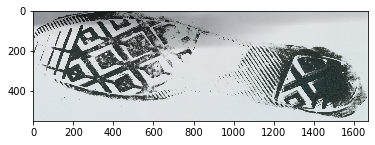

...

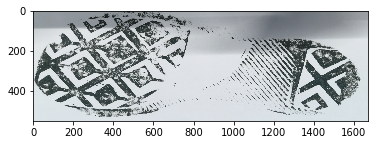

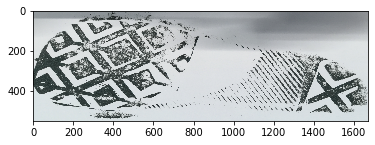

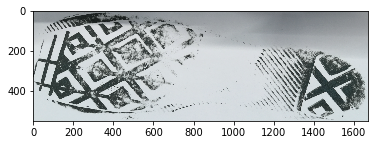

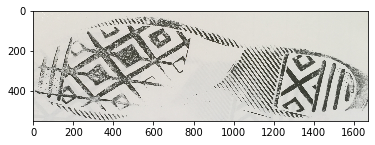

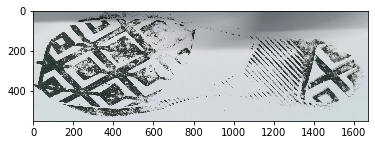

In [0]:
temp = []
for i, row in enumerate(data_id['train']):
  if data_id['id'].iloc[i] == False:
    temp.append(flip180(row))
    print
  else:
    temp.append(row)

data_id['test'] = temp

for i in data_id['test']:
  plt.figure()
  plt.imshow(i)

In [0]:
with open('data.pl','wb+') as f:
  pickle.dump(data,f)

In [0]:
(width,height,depth) = (550,1670,3)

age_model = Sequential()

age_model.add(Conv2D(32,kernel_size = (2,2), 
                input_shape = (width,height,depth), 
                activation = 'relu',
                padding = 'same'))
age_model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
age_model.add(BatchNormalization())

age_model.add(Conv2D(32,
                kernel_size = (2,2), 
                activation = 'relu',
                padding = 'same'))
age_model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
age_model.add(BatchNormalization())

age_model.add(Conv2D(32,
                kernel_size = (2,2), 
                activation = 'sigmoid',
                padding = 'same'))
age_model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))
age_model.add(BatchNormalization())

age_model.add(Flatten())

age_model.add(Dense(128,activation='relu'))
age_model.add(Dense(128,activation='relu'))
age_model.add(Dense(32,activation='relu'))
age_model.add(Dense(1,activation='sigmoid'))

# ruler_model.add(Activation(activation='sigmoid'))
age_model.compile(optimizer='adam', loss='binary_crossentropy',metrics=['accuracy'])

In [0]:
tmp = pd.get_dummies(data['type'])

In [0]:
tmp

In [0]:
with open("id.pl", 'wb') as f:
  pickle.dump([x_train, x_test, y_train, y_test],f)

In [0]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(list(data_id['train']), list(data_id['id']), train_size=0.8)

In [0]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(list(data['train']), list(data['old']), train_size=0.8)

In [0]:
with open("old.pl", 'wb') as f:
  pickle.dump([x_train, x_test, y_train, y_test],f)

In [0]:
with open("id.pl", 'rb') as f:
  x_train, x_test, y_train, y_test = pickle.load(f)

In [0]:
age_model.fit(np.array(x_train),y_train,epochs=5)
age_model.evaluate(np.array(x_test),y_test)

Epoch 1/5


ResourceExhaustedError: ignored

In [0]:
y_test

[False, False, False]

In [0]:
from PIL import Image as pillow_Image

def imresize(imarray, *args ,**kwargs):
    return np.array(pillow_Image.fromarray(imarray).resize(*args, **kwargs))

In [0]:
age_model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 550, 1670, 32)     416       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 275, 835, 32)      0         
_________________________________________________________________
batch_normalization_8 (Batch (None, 275, 835, 32)      128       
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 275, 835, 32)      4128      
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 138, 418, 32)      0         
_________________________________________________________________
batch_normalization_9 (Batch (None, 138, 418, 32)      128       
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 138, 418, 32)     

In [0]:
import keract

In [0]:
new_activations.keys()

odict_keys(['max_pooling2d_6/MaxPool:0'])

In [0]:
keract_input = np.reshape(x_train[1], (1, 550, 1670, 3))

new_activations = keract.get_activations(age_model, keract_input, 'max_pooling2d_11')
# keract.display_activations(new_activations, cmap="Blues", save=False)

In [0]:
keract_input = np.reshape(x_train[2], (1, 550, 1670, 3))

old_activations = keract.get_activations(age_model, keract_input, 'max_pooling2d_11')
# keract.display_activations(old_activations, cmap="Blues", save=False)

In [0]:
def get_feature_activation_matrix(activations, feature):
    return activations[0, :, :, feature]

In [0]:
new_feature_activation_matrix

NameError: ignored

In [0]:
differences = []

for feature_index in range(32):
    new_feature_activation_matrix = get_feature_activation_matrix(
        new_activations['max_pooling2d_11/MaxPool:0'], feature_index)
    
    old_feature_activation_matrix = get_feature_activation_matrix(
        old_activations['max_pooling2d_11/MaxPool:0'], feature_index)

    difference = abs(np.sum(old_feature_activation_matrix))

    differences.append(difference)

max_difference = np.max(differences)
highest_feature_index = np.argmax(differences)

min_difference = np.min(differences)
lowest_feature_index = np.argmin(differences)

highest_feature_index, max_difference, lowest_feature_index, min_difference

(25, 2235.5493, 29, 1567.557)

In [0]:
feature_activation_matrix = get_feature_activation_matrix(old_activations['max_pooling2d_11/MaxPool:0'], highest_feature_index) 
scaled_feature_activation_matrix = imresize(feature_activation_matrix, (1670, 550), pillow_Image.LANCZOS)

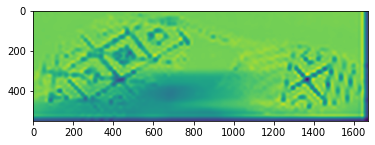

In [0]:
plt.imshow(scaled_feature_activation_matrix)

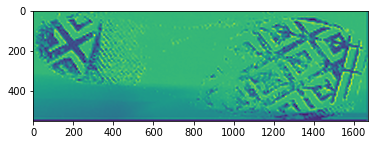

In [0]:
plt.imshow(scaled_feature_activation_matrix)

In [0]:
y_train

[True, False, True, True, False, False, True, True, True]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


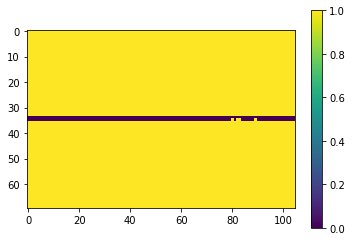

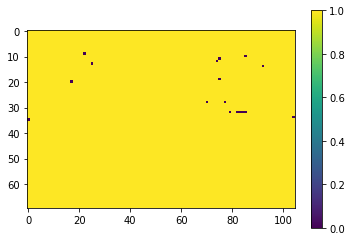

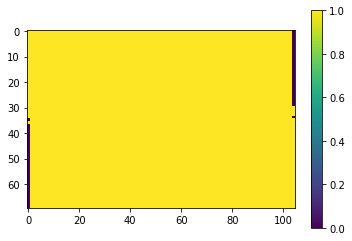

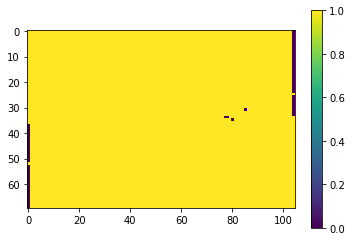

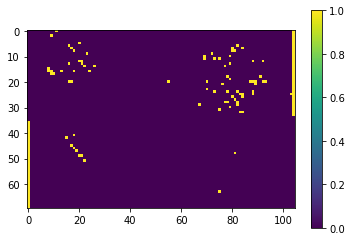

...

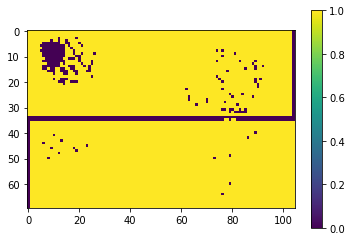

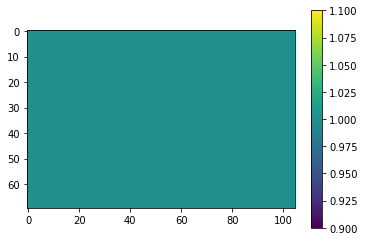

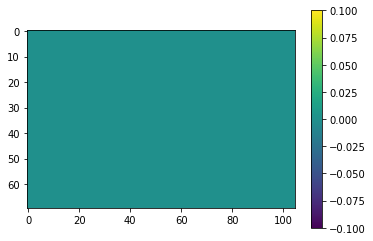

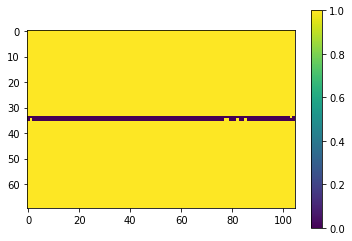

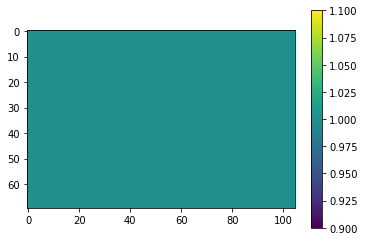

In [0]:
new_differences = []
old_differences = []

for feature_index in range(32):
    new_feature_activation_matrix = get_feature_activation_matrix(
        new_activations['max_pooling2d_11/MaxPool:0'], feature_index)
    
    old_feature_activation_matrix = get_feature_activation_matrix(
        old_activations['max_pooling2d_11/MaxPool:0'], feature_index)

    plt.figure()
    # new = imresize(new_feature_activation_matrix, (1670, 550), pillow_Image.LANCZOS)
    # old = imresize(old_feature_activation_matrix, (1670, 550), pillow_Image.LANCZOS)
    new = new_feature_activation_matrix
    old = old_feature_activation_matrix
    plt.imshow(np.concatenate([np.rint(new), np.rint(flip180(old))]))
    plt.colorbar()
    new_differences.append(new_feature_activation_matrix)
    old_differences.append(old_feature_activation_matrix)

### hide

In [0]:
new_differences = []
old_differences = []

for feature_index in range(32):
    new_feature_activation_matrix = get_feature_activation_matrix(
        new_activations['max_pooling2d_9/MaxPool:0'], feature_index)
    
    old_feature_activation_matrix = get_feature_activation_matrix(
        old_activations['max_pooling2d_9/MaxPool:0'], feature_index)

    plt.figure()
    
    plt.imshow(np.concatenate([new_feature_activation_matrix, flip180(old_feature_activation_matrix)]))
    new_differences.append(new_feature_activation_matrix)
    old_differences.append(old_feature_activation_matrix)

### show

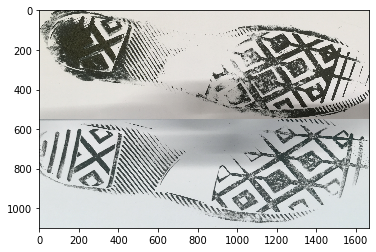

In [0]:
plt.imshow(np.concatenate([x_train[1],flip180(x_train[2])]))

In [0]:
# age_model.fit(np.array([data['train'][0],data['train'][0]]),[0,0],epochs=30)

## type classification

In [0]:
(width,height,depth) = (550,1670,3)

type_model = Sequential()

type_model.add(Conv2D(64,kernel_size = (2,2), 
                input_shape = (width,height,depth), 
                activation = 'relu',
                padding = 'same'))
type_model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))

type_model.add(Conv2D(64,
                kernel_size = (2,2), 
                activation = 'relu',
                padding = 'same'))
type_model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))

type_model.add(Conv2D(64,
                kernel_size = (2,2), 
                activation = 'relu',
                padding = 'same'))
type_model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))

# type_model.add(Conv2D(4,
#                 kernel_size = (2,2), 
#                 activation = 'relu',
#                 padding = 'same'))
# type_model.add(MaxPooling2D(pool_size = (2,2), padding = 'same'))

type_model.add(Flatten())
# type_model.add(Dropout(20))
type_model.add(Dense(128,activation='relu'))
type_model.add(Dense(64,activation='relu'))
type_model.add(Dense(32,activation='relu'))
type_model.add(Dense(5,activation='softmax'))

# ruler_model.add(Activation(activation='sigmoid'))
type_model.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['accuracy'])

In [0]:
with open("type.pl", 'wb') as f:
  pickle.dump([x_train, x_test, y_train, y_test],f)

In [0]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(list(data['train']), tmp, train_size=0.8)

In [0]:
type_model.fit(np.array(x_train),y_train,epochs=15)

Epoch 1/15


In [0]:
type_model.evaluate(np.array(x_test),y_test)

8/8 [==============================] - 0s 52ms/step


[0.0730263739824295, 1.0]

In [0]:
y_test.iloc[1]

ASDA               0
Brooks Ghost II    0
Converse           1
Primark            0
Yours clothing     0
Name: 18, dtype: uint8

In [0]:
y_test.iloc[2]

ASDA               0
Brooks Ghost II    1
Converse           0
Primark            0
Yours clothing     0
Name: 20, dtype: uint8

In [0]:
type_model.summary()

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_40 (Conv2D)           (None, 550, 1670, 32)     416       
_________________________________________________________________
max_pooling2d_40 (MaxPooling (None, 275, 835, 32)      0         
_________________________________________________________________
conv2d_41 (Conv2D)           (None, 275, 835, 32)      4128      
_________________________________________________________________
max_pooling2d_41 (MaxPooling (None, 138, 418, 32)      0         
_________________________________________________________________
conv2d_42 (Conv2D)           (None, 138, 418, 32)      4128      
_________________________________________________________________
max_pooling2d_42 (MaxPooling (None, 69, 209, 32)       0         
_________________________________________________________________
conv2d_43 (Conv2D)           (None, 69, 209, 4)      

In [0]:
keract_input = np.reshape(x_test[3], (1, 550, 1670, 3))

converse_activations = keract.get_activations(type_model, keract_input, 'max_pooling2d_43')
# keract.display_activations(new_activations, cmap="Blues", save=False)

xkeract_input = np.reshape(x_train[11], (1, 550, 1670, 3))

brooks_activations = keract.get_activations(type_model, xkeract_input, 'max_pooling2d_43')
# keract.display_activations(old_activations, cmap="Blues", save=False)

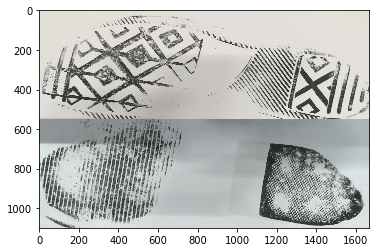

In [0]:
plt.imshow(np.concatenate([x_test[1],flip180(x_train[11])]))

In [0]:
keract.display_activations(brooks_activations, cmap="Blues", save=False)


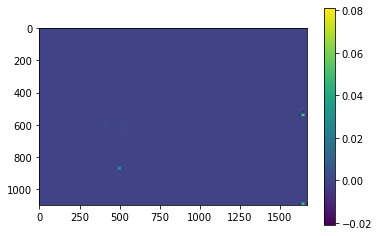

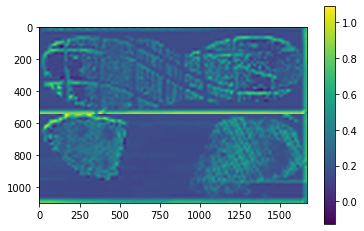

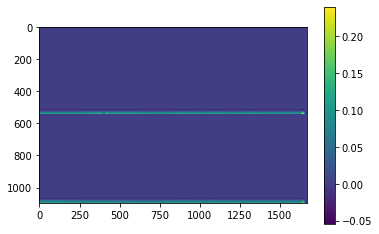

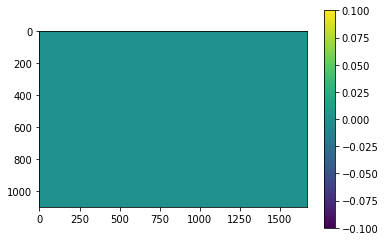

In [0]:
converse_differences = []
brooks_differences = []

for feature_index in range(4):
    converse_feature_activation_matrix = get_feature_activation_matrix(
        converse_activations['max_pooling2d_43/MaxPool:0'], feature_index)
    
    brooks_feature_activation_matrix = get_feature_activation_matrix(
        brooks_activations['max_pooling2d_43/MaxPool:0'], feature_index)

    plt.figure()
    converse = imresize(converse_feature_activation_matrix, (1670, 550), pillow_Image.LANCZOS)
    brooks = imresize(brooks_feature_activation_matrix, (1670, 550), pillow_Image.LANCZOS)
    plt.imshow(np.concatenate([converse, brooks]))
    plt.colorbar()
    converse_differences.append(converse_feature_activation_matrix)
    brooks_differences.append(brooks_feature_activation_matrix)